<a href="https://colab.research.google.com/github/ChihchengHsieh/multimodal-abnormalities-detection/blob/master/REFLACX_Dataset_Study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Google Drive Connection and Imports

### Set Up Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Set Up GPU Connection

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))


Found GPU at: /device:GPU:0


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Jan 20 02:10:40 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    37W / 300W |    471MiB / 16160MiB |      3%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Test if GPU is running correctly using a convulutional neural net

In [ ]:
%tensorflow_version 2.x
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')

cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
0.8263843920001364
GPU (s):
0.03540979499985042
GPU speedup over CPU: 23x


### Install Dependencies

In [ ]:
!/opt/conda/bin/python3.7 -m pip install -q --upgrade pip      # Upgrade PIP
!pip install -q pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg # Install/Upgrade PyDicom Dependencies
!pip install pydicom  # install dicom image processor
!pip install tensorflow_addons
!pip install altair vega_datasets
!pip install -U kaleido
!pip install dash
!pip install lime # install lime explainer
!pip install --upgrade numpy # needed for pydicom to work. Requires runtime restart

/bin/bash: /opt/conda/bin/python3.7: No such file or directory
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 180, in _main
    status = self.run(options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/req_command.py", line 199, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/install.py", line 385, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.7/dist

### Import Libraries

In [ ]:
import os
import numpy as np
import pandas as pd
import pydicom 
from pydicom.pixel_data_handlers.util import apply_voi_lut
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import plotly.graph_objects as go
import plotly.express as px
import altair as alt 
import matplotlib 
import plotly
import seaborn as sns

import gc

import pickle
import shutil
from tqdm.notebook import tqdm
from time import sleep
from tqdm import tqdm
import zipfile

import PIL
from PIL import Image,ImageDraw, ImageFont
import cv2

import warnings
import IPython

%matplotlib inline
sns.set()

# PRESETS
FIG_FONT = dict(family="Helvetica, Arial", size=14, color="#7f7f7f")
LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 15)]
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8]+LABEL_COLORS[9:]

## Aux Functions

#### Global Vars

In [ ]:
global TOTAL_EYEGAZE, TOTAL_REFLACX, TOTAL_BOTH, FLAG

FLAG = False 
# MIMIC-XAMI full dataset path
MIMIC_PATH = "/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/"
# REFLACX dataset path
REFLACX_PATH = "/content/drive/MyDrive/Datasets/REFLACX/gaze_data/"
# MIMIC-CXR dataset path
PATH = "/content/drive/MyDrive/Datasets/physionet.org/files/mimic-cxr-jpg/2.0.0/"
# Path to save files
BASE_DIR = "/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/physionet.org/files/mimic-cxr/2.0.0/files/"

PATIENTS_DIC = {}



#### Functions

In [ ]:
def update_REFLACX_data(patient_ID, patient_folder ):
  """
  updates dictinary with file paths for each REFLACX patient
  """
  PATIENTS_DIC[patient_ID]['REFLACX_PATH'] = MIMIC_PATH + patient_folder  + "/REFLACX/"
  PATIENTS_DIC[patient_ID]['METADATA'] = MIMIC_PATH + patient_folder  + "/REFLACX/metadata.csv"

  counter = 0
  for study in os.listdir(MIMIC_PATH + patient_folder  + "/REFLACX/"):
    PATIENTS_DIC[patient_ID]["METADATA"] = MIMIC_PATH + patient_folder  + "/REFLACX/metadata.csv"

    if "P" in study:
      counter += 1
      PATIENTS_DIC[patient_ID]['TOTAL_STUDIES'] = counter
      for file in os.listdir(MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/"):
        PATIENTS_DIC[patient_ID]['BOUNDING_BOX_' + str(counter)] = MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/chest_bounding_box.csv"
        PATIENTS_DIC[patient_ID]['ELLIPSES_' + str(counter)] = MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/anomaly_location_ellipses.csv"
        PATIENTS_DIC[patient_ID]['FIXATIONS_' + str(counter)] = MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/fixations.csv"
        PATIENTS_DIC[patient_ID]['GAZE'] = REFLACX_PATH + study + "/gaze.csv"
        PATIENTS_DIC[patient_ID]['TRANSCRIPTS_' + str(counter)] = MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/timestamps_transcription.csv"
        PATIENTS_DIC[patient_ID]['TRANSCRIPTS_TXT_' + str(counter)] = MIMIC_PATH + patient_folder  + "/REFLACX/" + study + "/transcription.txt"

def update_CXR_Images_JPG(patient_ID, patient_folder):
  PATIENTS_DIC[patient_ID]['CXR_JPG_PATH'] = MIMIC_PATH + patient_folder + "/CXR-JPG/"
  
  counter = 0
  for study in os.listdir(MIMIC_PATH + patient_folder + "/CXR-JPG/"):
    if not("." in study):
      PATIENTS_DIC[patient_ID]['TOTAL_STUDIES_CXR_JPG'] = counter
      for file in os.listdir(MIMIC_PATH + patient_folder + "/CXR-JPG/" + study + "/"):
        if "html" in file:
          continue
        counter += 1
        PATIENTS_DIC[patient_ID]["CXR_JPG_" + str(counter) ] = MIMIC_PATH + patient_folder + "/CXR-JPG/" + study + "/" + file

def update_CXR_Images_DICOM(patient_ID, patient_folder):
  PATIENTS_DIC[patient_ID]['CXR_DICOM_PATH'] = MIMIC_PATH + patient_folder + "/CXR-DICOM/"
  
  counter = 0
  counter_txt = 0
  for study in os.listdir(MIMIC_PATH + patient_folder + "/CXR-DICOM/"):
    if "txt" in study:
      counter_txt += 1
      PATIENTS_DIC[patient_ID]["CXR_REPORT_" + str(counter_txt) ] = MIMIC_PATH + patient_folder + "/CXR-DICOM/" + study 

    if not("." in study):
      PATIENTS_DIC[patient_ID]['TOTAL_STUDIES_CXR_DICOM'] = counter
      
      for file in os.listdir(MIMIC_PATH + patient_folder + "/CXR-DICOM/" + study + "/"):
        if "dcm" in file:
          counter += 1
          PATIENTS_DIC[patient_ID]["CXR_DICOM_" + str(counter) ] = MIMIC_PATH + patient_folder + "/CXR-DICOM/" + study + "/" + file

def fill_dictionary():
  TOTAL_EYEGAZE = 0
  TOTAL_REFLACX = 0
  TOTAL_BOTH = 0

  print("Filling dictionary...\n")
  patients_dir = os.listdir(MIMIC_PATH)

  # get Eye Gaze Paper Patients
  patients_eye_gaze = []
  for patient_folder in patients_dir:
    # check if it is a folder
    if ("." in patient_folder) or not("_" in patient_folder):
      continue

    # drill down into patient data
    patient_data = os.listdir(MIMIC_PATH + patient_folder)
    # get patient ID
    patient_ID = patient_folder.split("_")[1]

    # create dictionary with filepaths for each patient
    PATIENTS_DIC[patient_ID] = {}
    PATIENTS_DIC[patient_ID]['ID'] = patient_folder.split("_")[1]
    
    # get JPG image
    update_CXR_Images_JPG(patient_ID, patient_folder)
    # get DICOM image
    update_CXR_Images_DICOM(patient_ID, patient_folder)

    PATIENTS_DIC[patient_ID]['Core_PATH'] = MIMIC_PATH + patient_folder + "/Core/"
    PATIENTS_DIC[patient_ID]['ED'] = MIMIC_PATH + patient_folder + "/ED/"
    PATIENTS_DIC[patient_ID]['REFLACX_PATH'] = None
    PATIENTS_DIC[patient_ID]['EYE_GAZE_PATH'] = None
    PATIENTS_DIC[patient_ID]['BOTH?'] = False

    if ("REFLACX" in patient_data) & ("EyeGaze" in patient_data):
      PATIENTS_DIC[patient_ID]['BOTH?'] = True
      TOTAL_BOTH += 1

    if "REFLACX" in patient_data:
      update_REFLACX_data(patient_ID, patient_folder )
      TOTAL_REFLACX += 1

    if "EyeGaze" in patient_data:
      PATIENTS_DIC[patient_ID]['EYE_GAZE_PATH'] = MIMIC_PATH + patient_folder + "/EyeGaze/"
      TOTAL_EYEGAZE += 1   
  print("Complete!\n")  


def save_dictionary( path, dictionary):
  dic_file = open( path, "wb")
  pickle.dump(dictionary, dic_file)
  dic_file.close()

def load_dictionary( path ):
  dic_file = open( path, "rb" )
  PATIENTS_DIC = pickle.load(dic_file)
  return PATIENTS_DIC

def copy_dicom_jpg( patient, metadata ):

  for path in np.unique(metadata['image'].values):
    p_folder = path.split("/")[5]
    patient_folder = path.split("/")[6]
    study = path.split("/")[7]
    dicom = path.split("/")[8]
    jpg = path.split("/")[8].replace("dcm", "jpg")
    
    if not os.path.exists(BASE_DIR + p_folder + "/"):
      os.makedirs(BASE_DIR + p_folder + "/")

    if not os.path.exists(BASE_DIR + p_folder + "/" + patient_folder + "/"):
      os.makedirs(BASE_DIR + p_folder + "/" + patient_folder + "/")

    if not os.path.exists(BASE_DIR + p_folder + "/" + patient_folder + "/" + study + "/"):
      os.makedirs(BASE_DIR + p_folder + "/" + patient_folder + "/" + study + "/")

    jpg_xami_path =  PATIENTS_DIC[patient]['CXR_JPG_1']
    try:
      dicom_xami_path =  PATIENTS_DIC[patient]['CXR_DICOM_1'] 
    except KeyError:
        print("[ERROR KeyError] \t" + patient)
        return

    try:
      if dicom in PATIENTS_DIC[patient]['CXR_DICOM_2']:
        dicom_xami_path =  PATIENTS_DIC[patient]['CXR_DICOM_2']
        jpg_xami_path =  PATIENTS_DIC[patient]['CXR_JPG_2']
    except KeyError:
        dicom_xami_path =  PATIENTS_DIC[patient]['CXR_DICOM_1'] 
        jpg_xami_path =  PATIENTS_DIC[patient]['CXR_JPG_1']
    
    try:
      source_dicom_file = open(dicom_xami_path, 'rb')
      dest_dicom_file = open(BASE_DIR + p_folder + "/" + patient_folder + "/" + study + "/" + dicom, 'wb')

      #print("\nCopying DICOM Images...")
      #print("\t[DICOM SOURCE] " + str(source_dicom_file ))
      #print("\t[DICOM TARGET] " + str(dest_dicom_file))
      shutil.copyfileobj(source_dicom_file, dest_dicom_file)

      source_jpg_file = open(jpg_xami_path, 'rb')
      dest_jpg_file = open(BASE_DIR + p_folder + "/" + patient_folder + "/" + study + "/" + jpg, 'wb')

      #print("Copying JPG Images...")
      #print("\t[JPG SOURCE] " + str(source_jpg_file ))
      #print("\t[JPG TARGET] " + str(dest_jpg_file))
      shutil.copyfileobj(source_jpg_file, dest_jpg_file)
    except FileNotFoundError:
      print("[ERROR File Not Found] " + patient)
      
def flatten(t):
    return [item for sublist in t for item in sublist]

def create_fractional_bbox_coordinates(row):
    """ Function to return bbox coordiantes as fractions from DF row """
    frac_x_min = row["x_min"]/row["img_width"]
    frac_x_max = row["x_max"]/row["img_width"]
    frac_y_min = row["y_min"]/row["img_height"]
    frac_y_max = row["y_max"]/row["img_height"]
    return frac_x_min, frac_x_max, frac_y_min, frac_y_max


## Download MIMIC-CXR Dataset

In [ ]:
if FLAG: # no need to download. Dataset already in XAMI-MIMIC folder
  %cd /content/drive/MyDrive/Datasets
  !wget -r -N -c -np --user catarinamoreira --ask-password https://physionet.org/files/mimic-cxr-jpg/2.0.0/

## Recreate MIMIC-CXR

### Generate Filepaths for each Patient

In [ ]:
if FLAG: # Dictionary already on disk
  fill_dictionary() # this will take a while
  save_dictionary( MIMIC_PATH + "PATIENTS_DIC.pkl", PATIENTS_DIC)
else:
  PATIENTS_DIC = load_dictionary(  MIMIC_PATH + "PATIENTS_DIC.pkl" )

In [ ]:
PATIENTS_DIC.keys()

dict_keys(['16987846', '16994918', '16983225', '17002650', '16993562', '16974113', '17028421', '17023312', '17012909', '17029854', '17021691', '17007294', '17025050', '17030962', '17025899', '17032041', '17051517', '17071904', '17058070', '17069014', '17037502', '17036580', '17057667', '17037515', '17052080', '17032538', '17105544', '17076921', '17077306', '17080143', '17088741', '17094353', '17098181', '17087909', '17081089', '17079601', '17107268', '17112351', '17112205', '17106724', '17112471', '17112109', '17111670', '17112631', '17112432', '17106431', '17114989', '17132849', '17114146', '17114771', '17112662', '17133357', '17132530', '17115211', '17113838', '17128291', '17147859', '17167982', '17137002', '17137767', '17139582', '17142246', '17135164', '17165503', '17169510', '17136992', '17197332', '17174750', '17201840', '17174977', '17194362', '17190208', '17189198', '17182700', '17172702', '17185860', '17221020', '17207751', '17216531', '17206933', '17216263', '17202344', '1720

In [ ]:
PATIENTS_DIC['17002650']

{'BOTH?': False,
 'BOUNDING_BOX_1': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/REFLACX/P300R401646/chest_bounding_box.csv',
 'CXR_DICOM_1': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/CXR-DICOM/s55956018/e4be273a-71ae5195-0e709101-443f8266-59724576.dcm',
 'CXR_DICOM_PATH': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/CXR-DICOM/',
 'CXR_JPG_1': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/CXR-JPG/s55956018/e4be273a-71ae5195-0e709101-443f8266-59724576.jpg',
 'CXR_JPG_PATH': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/CXR-JPG/',
 'CXR_REPORT_1': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/CXR-DICOM/s55956018.txt',
 'Core_PATH': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/Core/',
 'ED': '/content/drive/MyDrive/Datasets/XAMI-MIMIC/XAMI-MIMIC/patient_17002650/ED/',
 'ELLIPSES_1': '/content/drive/MyDr

In [ ]:
PATIENTS_DIC.keys()

dict_keys(['16987846', '16994918', '16983225', '17002650', '16993562', '16974113', '17028421', '17023312', '17012909', '17029854', '17021691', '17007294', '17025050', '17030962', '17025899', '17032041', '17051517', '17071904', '17058070', '17069014', '17037502', '17036580', '17057667', '17037515', '17052080', '17032538', '17105544', '17076921', '17077306', '17080143', '17088741', '17094353', '17098181', '17087909', '17081089', '17079601', '17107268', '17112351', '17112205', '17106724', '17112471', '17112109', '17111670', '17112631', '17112432', '17106431', '17114989', '17132849', '17114146', '17114771', '17112662', '17133357', '17132530', '17115211', '17113838', '17128291', '17147859', '17167982', '17137002', '17137767', '17139582', '17142246', '17135164', '17165503', '17169510', '17136992', '17197332', '17174750', '17201840', '17174977', '17194362', '17190208', '17189198', '17182700', '17172702', '17185860', '17221020', '17207751', '17216531', '17206933', '17216263', '17202344', '1720

### Create Dataset by Copying dicom and jpg images to the physionet file structure

In [ ]:
# creates dataset
if FLAG:
  cnt = 0
  total_patients =  len( PATIENTS_DIC.keys() )
  patient_list = list(PATIENTS_DIC.keys())

  for patient in patient_list:
    cnt = cnt + 1
    print("\nProcessing patient ID p" + patient + "\t" +str(cnt) + " out of " + str( total_patients ) )
    
    reflacx_path = PATIENTS_DIC[patient]['REFLACX_PATH']
    
    if reflacx_path is None:
      continue
    
    #print( reflacx_path )
    metadata = pd.read_csv( PATIENTS_DIC[patient]['METADATA'] )
    copy_dicom_jpg( patient, metadata )

### Make zip file

In [ ]:

def make_zipfile(output_filename, source_dir):
    relroot = os.path.abspath(os.path.join(source_dir, os.pardir))
    with zipfile.ZipFile(output_filename, "w", zipfile.ZIP_DEFLATED) as zip:
        for root, dirs, files in os.walk(source_dir):
            # add directory (needed for empty dirs)
            zip.write(root, os.path.relpath(root, relroot))
            for file in files:
                filename = os.path.join(root, file)
                if os.path.isfile(filename): # regular files only
                    arcname = os.path.join(os.path.relpath(root, relroot), file)
                    zip.write(filename, arcname)

if FLAG:
  make_zipfile('MIMIC_CXR_FINAL.zip', '/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/', )

## MIMIC-CXR Dataset

In [ ]:
def get_patient_lesions( patients_with_lesions, patients_without_lesions ):

  cnt = 0
  patient_lesion_df = pd.DataFrame( [], columns = ["patient_id", "lesion"])
  for patient_id in patients_with_lesions:
    temp = pd.read_csv(PATIENTS_DIC[patient_id]['ELLIPSES_1'])
    temp.drop(["xmin", "ymin", "xmax", "ymax", "certainty"], axis=1, inplace=True)

    for indx in range(0, temp.shape[0]):
      for c in temp.columns:
        if temp.at[indx, c]:
          patient_lesion_df.at[cnt, 'patient_id'] = patient_id
          patient_lesion_df.at[cnt, 'lesion'] = c
          cnt = cnt + 1

  for patient_id in patients_without_lesions:
    cnt = cnt + 1
    patient_lesion_df.at[cnt, 'patient_id'] = patient_id
    patient_lesion_df.at[cnt, 'lesion'] = "Normal"
          
  return patient_lesion_df

### EXPLORATION OF BBOX COORDINATE COLUMNS

The **x_min**, **y_min**, **x_max**, and **y_max** columns indicate the location of the annotated object bounding box, where the top-left corner is represented by the tuple **(x_min, y_min)** and the bottom-right corner is represented by the tuple **(x_max, y_max)**.

A value of NaN coincides with a No finding and means that there is nothing to annotate (healthy x-ray).

For the purpose of examining these columns we will only be examining rows where the objects have been annotated with a bounding box
(i.e. All rows with a label of No finding will be discarded)


In [ ]:
# Get bounding box data from a single radiologist
if FLAG:
  patients_with_lesions = []
  patients_without_lesions = []
  not_reflacx = 0
  for patient_id in PATIENTS_DIC.keys():
  
    # this line is to ensure that we select only 
    # the patients that belong to REFLACX
    if PATIENTS_DIC[patient_id]['REFLACX_PATH'] == None:
      not_reflacx = not_reflacx + 1
      continue

    temp = pd.read_csv( PATIENTS_DIC[patient_id]['ELLIPSES_1'] )
    # this makes sure that we keep only the patients that have lesions
    if temp.shape[0] == 0:
      patients_without_lesions.append(patient_id)
      continue
    patients_with_lesions.append(patient_id)
    
  patient_lesion_df = get_patient_lesions( patients_with_lesions, patients_without_lesions )
  patient_lesion_df.to_csv("/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/patients_lesions.csv", index=False)
  print("There are a total of " + str(len(patients_with_lesions)) + " images in REFLACX with lesions out of " + str(len(PATIENTS_DIC.keys()) - not_reflacx) + "!")
 
else:
  patient_lesion_df = pd.read_csv("/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/patients_lesions.csv")
  normal = patient_lesion_df[ patient_lesion_df['lesion'] == "Normal"]
  print("There are a total of " +  str(2199 - normal.shape[0]) + " images in REFLACX with lesions out of 2199 images!")


There are a total of 1435 images in REFLACX with lesions out of 2199 images!


In [ ]:
# encode lesions in a dictionary
label_to_id = {}
id_to_label = {}

lesion_names = patient_lesion_df['lesion'].values
lesion_names = np.unique(lesion_names)
for i in range(0, len(lesion_names)):
  label_to_id[lesion_names[i]] = i
  id_to_label[i] = lesion_names[i]

In [ ]:
if FLAG:
  # Initalize our map for image sizes
  total_lesions = len(label_to_id)
  sizes_of_images_w_bboxes = {}
  bbox_df = pd.DataFrame([], columns=['patient_id', 'image_id', 'x_min', 'y_min', 'x_max', 'y_max', 'certainty'])

  bbox_df_temp = []
  # Get the image sizes so we can resize the bboxes all based on a static size
  # so that we can generate a heatmap that is representative of the actual
  # locations of annotations
  cnt = 0
  patients_with_lesions = patient_lesion_df[ patient_lesion_df.lesion != "Normal"]['patient_id'].unique()
  values = range(len(patients_with_lesions))

  with tqdm(total=len(values)) as pbar:
    for (patient, i) in zip(patients_with_lesions, range(0,len(patients_with_lesions))):
      patient = str(patient)

      # get bounding boxes
      ellipse_df = pd.read_csv( PATIENTS_DIC[patient]['ELLIPSES_1'] )
      ellipse_df_temp = ellipse_df[['xmin','ymin', 'xmax', 'ymax', 'certainty']] 
      path = PATIENTS_DIC[patient]['CXR_DICOM_1']
      image_id = path.split("/")[-1].replace(".dcm", "")

      # for each ellipse...
      for ellipse_indx in range(0, ellipse_df_temp.shape[0] ):

        # find image lesions
        for label in ellipse_df.columns.values[5:]:
          check_lesion = ellipse_df.at[ellipse_indx, label]

          if check_lesion:
            # add bounding boxes for ellipses to the dataframe
            class_id = label_to_id[label]
            base = [[patient, image_id]]
            base.append(ellipse_df_temp.iloc[ellipse_indx].values.tolist())
            bbox_df.at[cnt,['patient_id', 'image_id','x_min','y_min', 'x_max', 'y_max', 'certainty']] = flatten(base)
            bbox_df.at[cnt,"class_id"] =  label_to_id[label]
            cnt = cnt + 1
            
      # get DICOM image dimensions (todo: we dont know if this is the frontal image)
      dicom = pydicom.read_file(path)
      sizes_of_images_w_bboxes[image_id] = (dicom.Rows, dicom.Columns)

      # process bar visualization
      pbar.write('processed: %d' %(i+1))
      pbar.update(1)
      sleep(1)

  # Create new dataframe columns for the source image width and height
  bbox_df["img_height"] = bbox_df["image_id"].map(lambda x: sizes_of_images_w_bboxes[x][0])
  bbox_df["img_width"] = bbox_df["image_id"].map(lambda x: sizes_of_images_w_bboxes[x][1])

  # Create new dataframe columns for the bboxes that is a 
  # percentage of the respective source image width and height
  #   -- i.e. if x_min is 100 and the image width is 1000 than frac_x_min is 0.1
  #   -- i.e. if y_max is 28 and the image height is 900 than frac_y_max is 0.031
  #
  # This will allow us to pick a heat-map size and make sure that we can use
  # all of the bounding boxes and scale them appropriately
  #   -- NOTE: We will most likely default the heatmap to the average
  #            image shape so that there is as little distortion as possible
  bbox_df["frac_x_min"], bbox_df["frac_x_max"], bbox_df["frac_y_min"], bbox_df["frac_y_max"] = \
      zip(*bbox_df.apply(create_fractional_bbox_coordinates, axis=1))

  # # Record some important values for later
  ave_src_img_height = np.mean([size[0] for size in sizes_of_images_w_bboxes.values()], dtype=np.int32)
  ave_src_img_width  = np.mean([size[1] for size in sizes_of_images_w_bboxes.values()], dtype=np.int32)

  # save dataframe
  bbox_df.to_csv("/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/bbox_reflacx_v3.csv", index=False)
else:
  # load existing dataframe
  bbox_df = pd.read_csv("/content/drive/MyDrive/Datasets/MIMIC_CXR_FINAL/bbox_reflacx_v3.csv")


In [ ]:
bbox_df.head()

,patient_id,image_id,x_min,y_min,x_max,y_max,certainty,class_id,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max
0,17002650,e4be273a-71ae5195-0e709101-443f8266-59724576,526,1525,1227,1890,4,3,3056,2544,0.206761,0.482311,0.499018,0.618455
1,16993562,3985fb40-96f20ee4-34863709-7c5a6722-62b62913,635,1163,1158,1380,4,3,2556,2544,0.249607,0.455189,0.455008,0.539906
2,17028421,e006a6a5-3426dfe3-3138270e-6abc5dca-f8d87e4c,495,973,716,1180,5,8,2022,1736,0.285138,0.412442,0.481207,0.583581
3,17023312,53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44,1202,1137,2490,1854,4,6,2544,3056,0.393325,0.814791,0.446934,0.728774
4,17012909,a05e35cd-61145929-8fa06203-83e2aa38-9692e6bf,114,1193,481,1466,5,16,2022,1786,0.063830,0.269317,0.590010,0.725025


In [ ]:
if not FLAG:
  ave_src_img_height = 2719
  ave_src_img_width = 2586


In [ ]:
label_to_id

{'Abnormal mediastinal contour': 0,
 'Acute fracture': 1,
 'Airway wall thickening': 2,
 'Atelectasis': 3,
 'Consolidation': 4,
 'Emphysema': 5,
 'Enlarged cardiac silhouette': 6,
 'Enlarged hilum': 7,
 'Groundglass opacity': 8,
 'Hiatal hernia': 9,
 'High lung volume / emphysema': 10,
 'Interstitial lung disease': 11,
 'Lung nodule or mass': 12,
 'Nodule': 13,
 'Normal': 14,
 'Other': 15,
 'Pleural abnormality': 16,
 'Pleural effusion': 17,
 'Pneumothorax': 18,
 'Pulmonary edema': 19,
 'Wide mediastinum': 20}

In [ ]:
patient_lesion_df['lesion'].value_counts()

Pleural abnormality             831
Atelectasis                     806
Consolidation                   787
Normal                          764
Pulmonary edema                 475
Enlarged cardiac silhouette     455
Groundglass opacity             411
Lung nodule or mass             150
High lung volume / emphysema     90
Pneumothorax                     81
Abnormal mediastinal contour     64
Interstitial lung disease        49
Enlarged hilum                   41
Acute fracture                   27
Pleural effusion                 24
Hiatal hernia                    20
Other                            13
Airway wall thickening            6
Nodule                            4
Emphysema                         2
Wide mediastinum                  2
Name: lesion, dtype: int64

In [ ]:
id_to_label

{0: 'Abnormal mediastinal contour',
 1: 'Acute fracture',
 2: 'Airway wall thickening',
 3: 'Atelectasis',
 4: 'Consolidation',
 5: 'Emphysema',
 6: 'Enlarged cardiac silhouette',
 7: 'Enlarged hilum',
 8: 'Groundglass opacity',
 9: 'Hiatal hernia',
 10: 'High lung volume / emphysema',
 11: 'Interstitial lung disease',
 12: 'Lung nodule or mass',
 13: 'Nodule',
 14: 'Normal',
 15: 'Other',
 16: 'Pleural abnormality',
 17: 'Pleural effusion',
 18: 'Pneumothorax',
 19: 'Pulmonary edema',
 20: 'Wide mediastinum'}

100%|██████████| 4338/4338 [00:12<00:00, 361.21it/s]


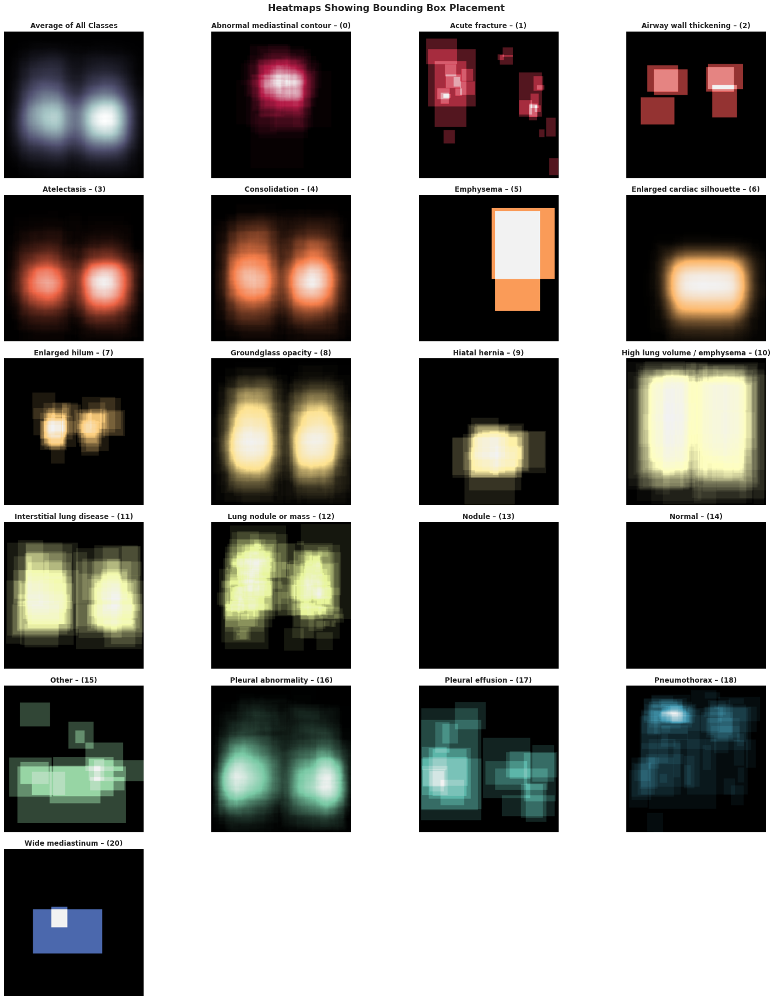

<Figure size 432x288 with 0 Axes>

In [ ]:
# DEFAULT
HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, len(label_to_id))

# Initialize
heatmap = np.zeros((HEATMAP_SIZE), dtype=np.int16)
bbox_np = bbox_df[["class_id", "frac_x_min", "frac_x_max", "frac_y_min", "frac_y_max"]].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int16)


# Color map stuff
custom_cmaps = [
    matplotlib.colors.LinearSegmentedColormap.from_list(
        colors=[(0.,0.,0.), c, (0.95,0.95,0.95)], 
        name=f"custom_{i}") for i,c in enumerate(sns.color_palette("Spectral", len(label_to_id)))
]

for row in tqdm(bbox_np, total=bbox_np.shape[0]):
  heatmap[row[3]:row[4]+1, row[1]:row[2]+1, row[0]] += 1

fig = plt.figure(figsize=(20,25))
#fig.subplots_adjust(wspace=0.5, hspace=0.5)
plt.suptitle("Heatmaps Showing Bounding Box Placement\n ", fontweight="bold", fontsize=16)
i = -1
for label_id in id_to_label.keys():
  
  i = i+1
  plt.subplot(6, 4, i+1)
  if i == 0:
      plt.axis(False)
      plt.imshow(heatmap.mean(axis=-1), cmap="bone")
      plt.title(f"Average of All Classes", fontweight="bold")
  else:
      plt.axis(False)
      plt.imshow(heatmap[:, :, i-1], cmap=custom_cmaps[i-1])
      plt.title(f"{id_to_label[label_id-1]} – ({label_id-1})", fontweight="bold")

plt.axis(False)
plt.imshow(heatmap[:, :, i], cmap=custom_cmaps[i])
plt.title(f"{id_to_label[label_id]} – ({label_id})", fontweight="bold")

fig.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

plt.savefig("/content/drive/MyDrive/Datasets/REFLACX_Heatmaps.png", dpi=300, bbox_inches='tight')

In [ ]:
#heatmaps =  Image.open( "/content/drive/MyDrive/Datasets/heatmap_reflacx.jpg" )
#heatmaps

### INVESTIGATE THE SIZES OF BOUNDING BOXES AND THE IMPACT OF CLASS

The general equation of the ellipse is given by:

$$E(h,k) = \frac{(x - h)^2}{a^2} + \frac{(y - k)^2}{b^2}$$

Where:
- Center: $(h,k)$
- Major axis: $(h-a, k) ; (h + a, k)$
- Minor axis: $(h, k - b) ; (h, k+b)$

The problem with our data is that the ellipse is given uniquely by four points (not coordinates): $X_{min}, X_{max}, Y_{min}, Y_{max}$.

To find the respective coordinates, we first need to find the values for $a$ and $b$ and then find the coordinates of the center. We can compute $a$ and $b$ in the following way:

$$ a = \frac{\left| X_{max} - X_{min} \right|}{2} ~~~~~~~ b = \frac{\left| Y_{max} - Y_{min} \right|}{2}$$

We can then compute the center in the following way:

  \begin{cases}
               h - a = X_{min} → h = X_{min} + a \\
               h + a = X_{max} → h = X_{max} - a \\
               k - b = Y_{min} → k = Y_{min} + b \\
               k + b = Y_{max} → k = Y_{max} - b 
            \end{cases}

Finally, the area of the ellipse is given by

$$ A = \pi a b$$

In [ ]:
# Update bbox dataframe to make this easier
bbox_df['a'] = np.abs(bbox_df['x_max'] - bbox_df['x_min'])/2.0
bbox_df['b'] = np.abs(bbox_df['y_max'] - bbox_df['y_min'])/2.0

bbox_df['a_frac'] = np.abs(bbox_df['frac_x_max'] - bbox_df['frac_x_min'])/2.0
bbox_df['b_frac'] = np.abs(bbox_df['frac_y_max'] - bbox_df['frac_y_min'])/2.0

bbox_df['h'] = bbox_df['x_min'] + bbox_df['a']
bbox_df['k'] = bbox_df['y_min'] + bbox_df['b']

bbox_df['h_frac'] = bbox_df['frac_x_min'] + bbox_df['a_frac']
bbox_df['k_frac'] = bbox_df['frac_y_min'] + bbox_df['b_frac']

bbox_df['bbox_area'] = np.pi * bbox_df['a'] * bbox_df['b']
bbox_df['frac_bbox_area'] = np.pi * bbox_df['a_frac'] * bbox_df['b_frac']


In [ ]:
bbox_df["class_label"] = bbox_df["class_id"].map(id_to_label)
display(bbox_df.head())

,patient_id,image_id,x_min,y_min,x_max,y_max,certainty,class_id,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max,a,b,a_frac,b_frac,h,k,h_frac,k_frac,bbox_area,frac_bbox_area,class_label
0,17002650,e4be273a-71ae5195-0e709101-443f8266-59724576,526,1525,1227,1890,4,3,3056,2544,0.206761,0.482311,0.499018,0.618455,350.5,182.5,0.137775,0.059719,876.5,1707.5,0.344536,0.558737,200955.901078,0.025848,Atelectasis
1,16993562,3985fb40-96f20ee4-34863709-7c5a6722-62b62913,635,1163,1158,1380,4,3,2556,2544,0.249607,0.455189,0.455008,0.539906,261.5,108.5,0.102791,0.042449,896.5,1271.5,0.352398,0.497457,89135.622962,0.013708,Atelectasis
2,17028421,e006a6a5-3426dfe3-3138270e-6abc5dca-f8d87e4c,495,973,716,1180,5,8,2022,1736,0.285138,0.412442,0.481207,0.583581,110.5,103.5,0.063652,0.051187,605.5,1076.5,0.348790,0.532394,35929.609781,0.010236,Groundglass opacity
3,17023312,53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44,1202,1137,2490,1854,4,6,2544,3056,0.393325,0.814791,0.446934,0.728774,644.0,358.5,0.210733,0.140920,1846.0,1495.5,0.604058,0.587854,725312.062305,0.093294,Enlarged cardiac silhouette
4,17012909,a05e35cd-61145929-8fa06203-83e2aa38-9692e6bf,114,1193,481,1466,5,16,2022,1786,0.063830,0.269317,0.590010,0.725025,183.5,136.5,0.102744,0.067507,297.5,1329.5,0.166573,0.657517,78689.827389,0.021790,Pleural abnormality


In [ ]:
from matplotlib.patches import Ellipse

def dicom2array(path, voi_lut=True, fix_monochrome=True):

    # Use the pydicom library to read the dicom file
    dicom = pydicom.read_file(path)
    
    # VOI LUT (if available by DICOM device) is used to 
    # transform raw DICOM data to "human-friendly" view
    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array
        
    # The XRAY may look inverted
    #   - If we want to fix this we can
    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
    
    # Normalize the image array and return
    data = data - np.min(data)
    data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

def plot_key_conditions( key_condition, bbox_df, image_type="dcm", figsize = (15,20), indexes = 0:20 ):

  fig = plt.figure(figsize=figsize)

  patients = bbox_df[ bbox_df['class_id'] == label_to_id[key_condition] ]
  patients_indx = patients.index.tolist()
  patients_indx = np.unique(patients_indx)
  print("Total patients with Key Condition " + key_condition + " = " + str(patients.shape[0]))

  for i in indexes:

    INDX = patients_indx[i]
    patient_id = patients.at[INDX, "patient_id"]
    h =  patients.at[INDX, "h"]
    k =  patients.at[INDX, "k"]
    a =  patients.at[INDX, "a"]*2
    b =  patients.at[INDX, "b"]*2

    if image_type == "dcm":
      img = dicom2array(PATIENTS_DIC[str(patient_id)]['CXR_DICOM_1'], voi_lut=True, fix_monochrome=True)
    else:
      img = Image.open(PATIENTS_DIC[str(patient_id)]['CXR_JPG_1'])
    plt.imshow(img, cmap='gray', aspect="equal")

    ax = plt.gca()

    ax.add_patch(Ellipse((h, k), width=a, height=b,
                        edgecolor='red',
                        facecolor='none',
                        linewidth=2))
    plt.axis(False)
    ax.set_title("PATIENT_ID: " + str(patient_id))
    
  fig.tight_layout(rect=[0, 0.03, 1, 0.97])
  plt.show()



### Eye Tracking Data

In [ ]:
patient_lesion_df['lesion'].value_counts()

Pleural abnormality             831
Atelectasis                     806
Consolidation                   787
Normal                          764
Pulmonary edema                 475
Enlarged cardiac silhouette     455
Groundglass opacity             411
Lung nodule or mass             150
High lung volume / emphysema     90
Pneumothorax                     81
Abnormal mediastinal contour     64
Interstitial lung disease        49
Enlarged hilum                   41
Acute fracture                   27
Pleural effusion                 24
Hiatal hernia                    20
Other                            13
Airway wall thickening            6
Nodule                            4
Emphysema                         2
Wide mediastinum                  2
Name: lesion, dtype: int64

In [ ]:
# Pleaural Abnormality

,patient_id,image_id,x_min,y_min,x_max,y_max,certainty,class_id,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max,a,b,a_frac,b_frac,h,k,h_frac,k_frac,bbox_area,frac_bbox_area,class_label
4067,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,1333,1330,2036,1943,4,3,3056,2544,0.523978,0.800314,0.435209,0.635798,351.5,306.5,0.138168,0.100295,1684.5,1636.5,0.662146,0.535504,338458.699136,0.043535,Atelectasis
4068,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,1333,1330,2036,1943,4,4,3056,2544,0.523978,0.800314,0.435209,0.635798,351.5,306.5,0.138168,0.100295,1684.5,1636.5,0.662146,0.535504,338458.699136,0.043535,Consolidation
4069,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,276,1251,1019,1868,4,3,3056,2544,0.108491,0.400550,0.409359,0.611257,371.5,308.5,0.146030,0.100949,647.5,1559.5,0.254520,0.510308,360050.865444,0.046312,Atelectasis
4070,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,276,1251,1019,1868,4,4,3056,2544,0.108491,0.400550,0.409359,0.611257,371.5,308.5,0.146030,0.100949,647.5,1559.5,0.254520,0.510308,360050.865444,0.046312,Consolidation
4071,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,1907,872,2203,1797,5,16,3056,2544,0.749607,0.865959,0.285340,0.588024,148.0,462.5,0.058176,0.151342,2055.0,1334.5,0.807783,0.436682,215042.017138,0.027660,Pleural abnormality
4072,10002428,fa771fa1-d9571d07-bff8f655-327734a7-6e10b29d,235,1154,845,2006,5,16,3056,2544,0.092374,0.332154,0.377618,0.656414,305.0,426.0,0.119890,0.139398,540.0,1580.0,0.212264,0.517016,408187.133481,0.052504,Pleural abnormality


In [ ]:
len

array([4067, 4068, 4069, 4070, 4071, 4072])

Total patients with Key Condition Pleural effusion = 6


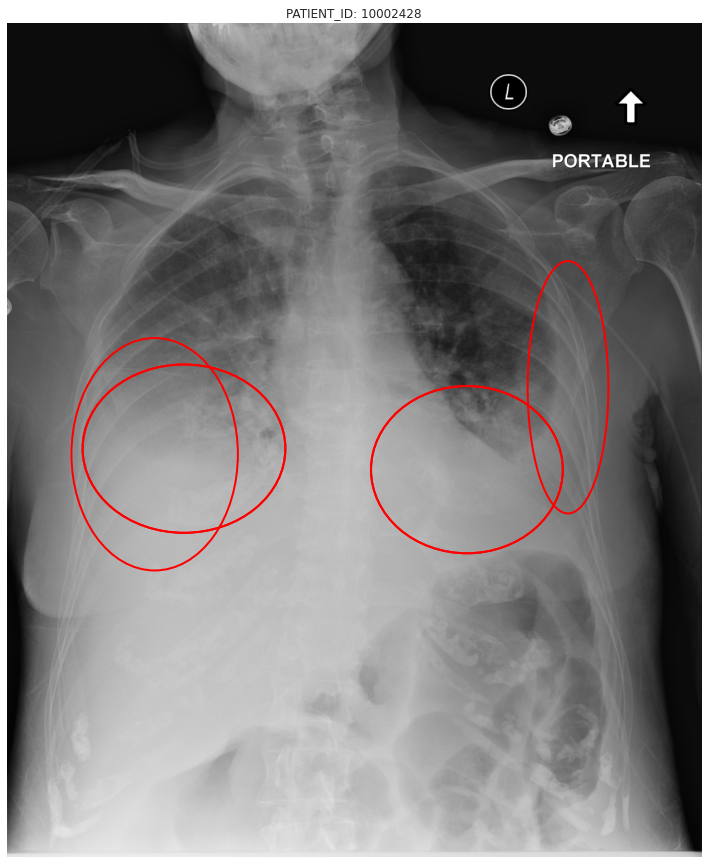

In [ ]:
image_type = "dcm"
fig = plt.figure(figsize=(10,15))

patients = bbox_df[ bbox_df['patient_id'] == 10002428]
patients = patients[["patient_id","x_min", "y_min", "x_max", "y_max", "h", "k", "a", "b", "class_label"]]
patients_indx = patients.index.tolist()
patients_indx = np.unique(patients_indx)
print("Total patients with Key Condition " + key_condition + " = " + str(patients.shape[0]))

for i in range(0,len(patients_indx)):

  INDX = patients_indx[i]
  patient_id = patients.at[INDX, "patient_id"]
  h =  patients.at[INDX, "h"]
  k =  patients.at[INDX, "k"]
  a =  patients.at[INDX, "a"]*2
  b =  patients.at[INDX, "b"]*2
  label = patients.at[INDX, "class_label"] 

  if image_type == "dcm":
    img = dicom2array(PATIENTS_DIC[str(patient_id)]['CXR_DICOM_1'], voi_lut=True, fix_monochrome=True)
  else:
    img = Image.open(PATIENTS_DIC[str(patient_id)]['CXR_JPG_1'])
  plt.imshow(img, cmap='gray', aspect="equal")

  ax = plt.gca()

  ax.add_patch(Ellipse((h, k), width=a, height=b,
                      edgecolor='red',
                      facecolor='none',
                      linewidth=2, label = label))
  plt.axis(False)
  ax.set_title("PATIENT_ID: " + str(patient_id))
  
fig.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [ ]:
for key in ["Pleural abnormality", "Atelectasis", "Consolidation", "Pulmonary edema", "Enlarged cardiac silhouette", "Groundglass opacity", 
            "Lung nodule or mass", "High lung volume / emphysema", "Pneumothorax", "Abnormal mediastinal contour", "Interstitial lung disease",
            "Enlarged hilum", "Pleural effusion"]:
            
  print(key)
  key_condition = key
  patients_with_kcond = bbox_df[ bbox_df["class_label"] == key_condition ]

  patients_with_kcond = patients_with_kcond['patient_id']
  patients_with_kcond = np.unique(patients_with_kcond)
  for INDX in range(0, len(patients_with_kcond))[0:20]:
    patient_id = patients_with_kcond[INDX]

    fig = plt.figure(figsize=(10,15))
    img = dicom2array(PATIENTS_DIC[str(patient_id)]['CXR_DICOM_1'], voi_lut=True, fix_monochrome=True)
    ax = plt.axes()
    ax.axis(False)
    ax.set_title("PATIENT_ID: " + str(patient_id))
    ax.imshow(img, cmap='gray', aspect="equal")
    plt.savefig("/content/drive/MyDrive/Experiments/Understand_EyeTracking/Key_Conditions/" + key_condition.replace("/", "_") + "/" + str(patient_id) + ".png",dpi=300)


  key_condition = key
  patients_with_kcond = bbox_df[ bbox_df["class_label"] == key_condition ]

  patients_with_kcond = patients_with_kcond['patient_id']
  patients_with_kcond = np.unique(patients_with_kcond)
  for INDX in range(0, len(patients_with_kcond))[0:20]:
    patient_id = patients_with_kcond[INDX]

    fixation_points = pd.read_csv( PATIENTS_DIC[str(patient_id)]['FIXATIONS_1'] )
    x_coord = fixation_points['x_position'].tolist()
    y_coord = fixation_points['y_position'].tolist()
    duration = np.abs(fixation_points['timestamp_end_fixation'] - fixation_points['timestamp_start_fixation']).tolist()

    fig = plt.figure(figsize=(10,15))
    img = dicom2array(PATIENTS_DIC[str(patient_id)]['CXR_DICOM_1'], voi_lut=True, fix_monochrome=True)
    ax = plt.axes()

    for i in range(len(x_coord)):
      ax.scatter(x_coord[i], y_coord[i], marker='o', color='red', s=500*duration[i], alpha=0.7)
      ax.set_title("PATIENT_ID: " + str(patient_id))
      #ax.plot(x_coord[i], y_coord[i], color='red')
    ax.imshow(img, cmap='gray', aspect="equal")
    ax.axis(False)
    plt.savefig("/content/drive/MyDrive/Experiments/Understand_EyeTracking/Key_Conditions/" + key_condition.replace("/", "_") + "/" + str(patient_id) + "_ET.png",dpi=300)
  #plt.show()


In [ ]:
key_condition = "Groundglass opacity"
patients_with_kcond = bbox_df[ bbox_df["class_label"] == key_condition ]

patients_with_kcond = patients_with_kcond['patient_id']
patients_with_kcond = np.unique(patients_with_kcond)
for INDX in range(0, len(patients_with_kcond))[0:20]:
  patient_id = patients_with_kcond[INDX]

  fixation_points = pd.read_csv( PATIENTS_DIC[str(patient_id)]['FIXATIONS_1'] )
  #gaze_points = pd.read_csv( PATIENTS_DIC[str(patient_id)]['GAZE'] )

  x_coord = fixation_points['x_position'].tolist()
  y_coord = fixation_points['y_position'].tolist()
  duration = np.abs(fixation_points['timestamp_end_fixation'] - fixation_points['timestamp_start_fixation']).tolist()

  fig = plt.figure(figsize=(10,15))
  img = dicom2array(PATIENTS_DIC[str(patient_id)]['CXR_DICOM_1'], voi_lut=True, fix_monochrome=True)
  ax = plt.axes()

  for i in range(len(x_coord)):
    ax.scatter(x_coord[i], y_coord[i], marker='o', color='red', s=500*duration[i], alpha=0.7)
    ax.set_title("PATIENT_ID: " + str(patient_id))
    #ax.plot(x_coord[i], y_coord[i], color='red')
  ax.imshow(img, cmap='gray', aspect="equal")
  ax.axis(False)
  plt.savefig("/content/drive/MyDrive/Experiments/Understand_EyeTracking/Key_Conditions/" + key_condition + "/" + str(patient_id) + "_ET.png",dpi=300)
#plt.show()

### Key Conditions

#### Abnormal mediastinal contour

Total patients with Key Condition Abnormal mediastinal contour = 64


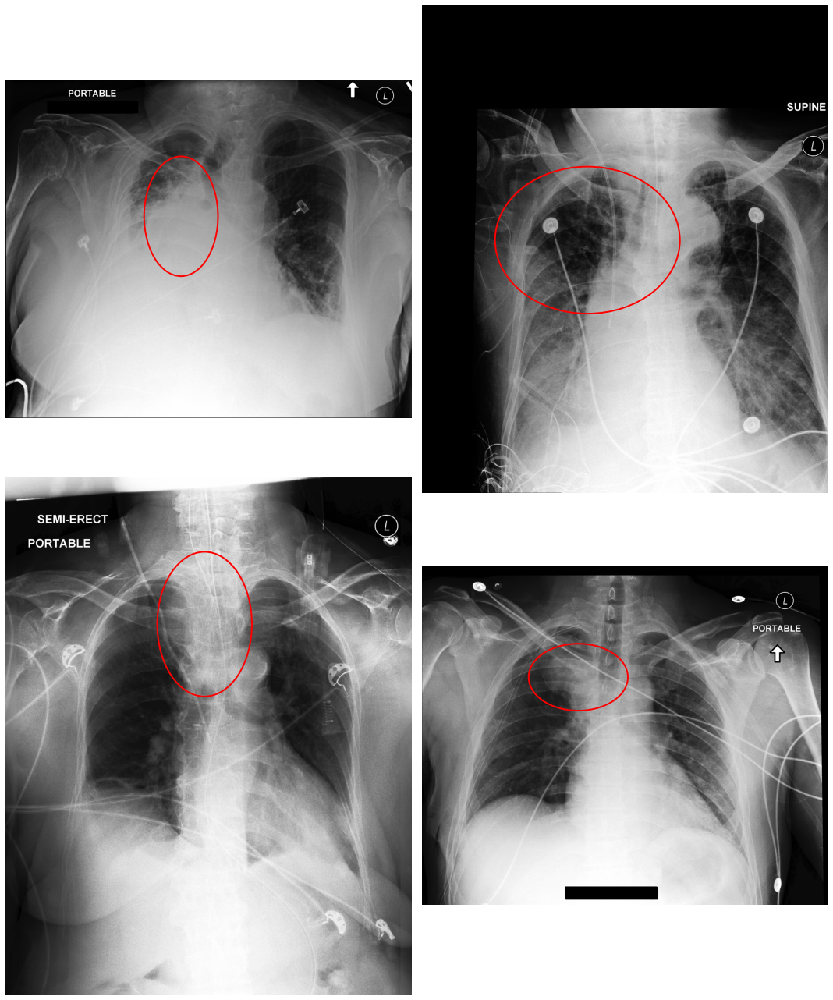

In [ ]:
plot_key_conditions( "Abnormal mediastinal contour", bbox_df, image_type="jpg", figsize = (15,20), indexes=[20,10,15,1] ) 

#### Acute fracture

Total patients with Key Condition Acute fracture = 27


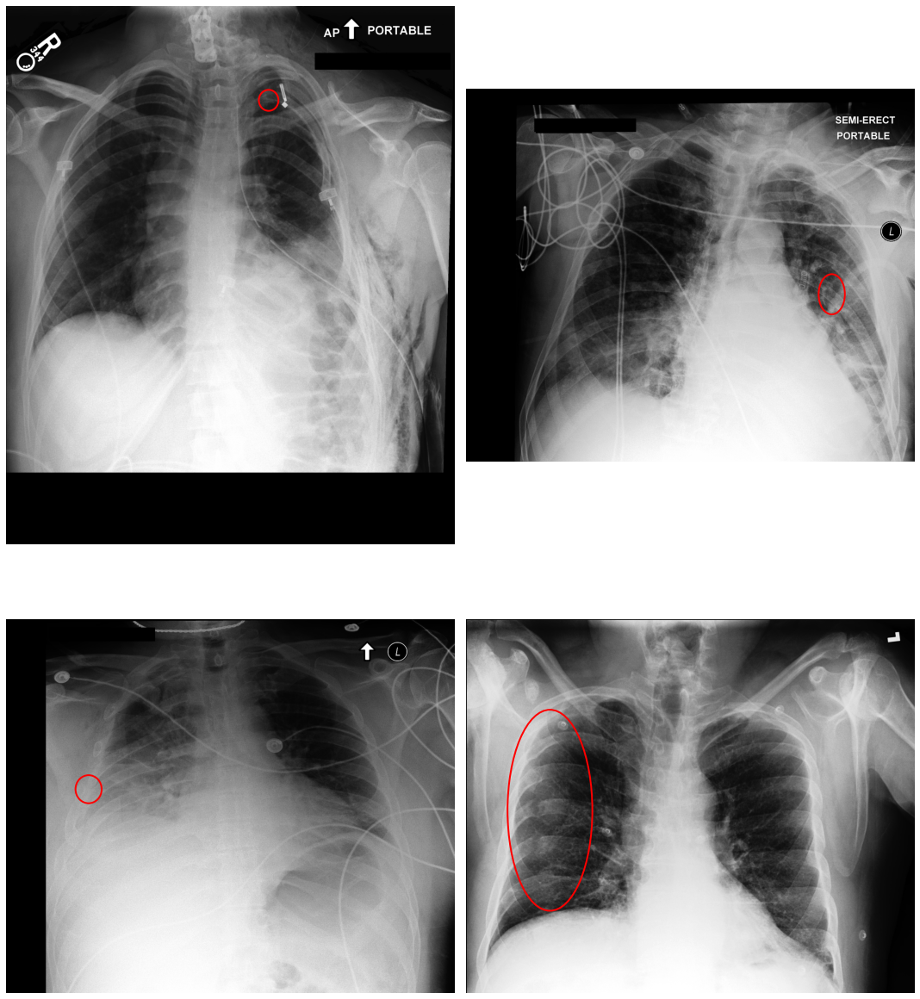

In [ ]:
key_condition = "Acute fracture"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[20,10,15,26] ) 

In [ ]:
id_to_label

{0: 'Abnormal mediastinal contour',
 1: 'Acute fracture',
 2: 'Airway wall thickening',
 3: 'Atelectasis',
 4: 'Consolidation',
 5: 'Emphysema',
 6: 'Enlarged cardiac silhouette',
 7: 'Enlarged hilum',
 8: 'Groundglass opacity',
 9: 'Hiatal hernia',
 10: 'High lung volume / emphysema',
 11: 'Interstitial lung disease',
 12: 'Lung nodule or mass',
 13: 'Nodule',
 14: 'Normal',
 15: 'Other',
 16: 'Pleural abnormality',
 17: 'Pleural effusion',
 18: 'Pneumothorax',
 19: 'Pulmonary edema',
 20: 'Wide mediastinum'}

#### Airway wall thickening

Total patients with Key Condition Airway wall thickening = 6


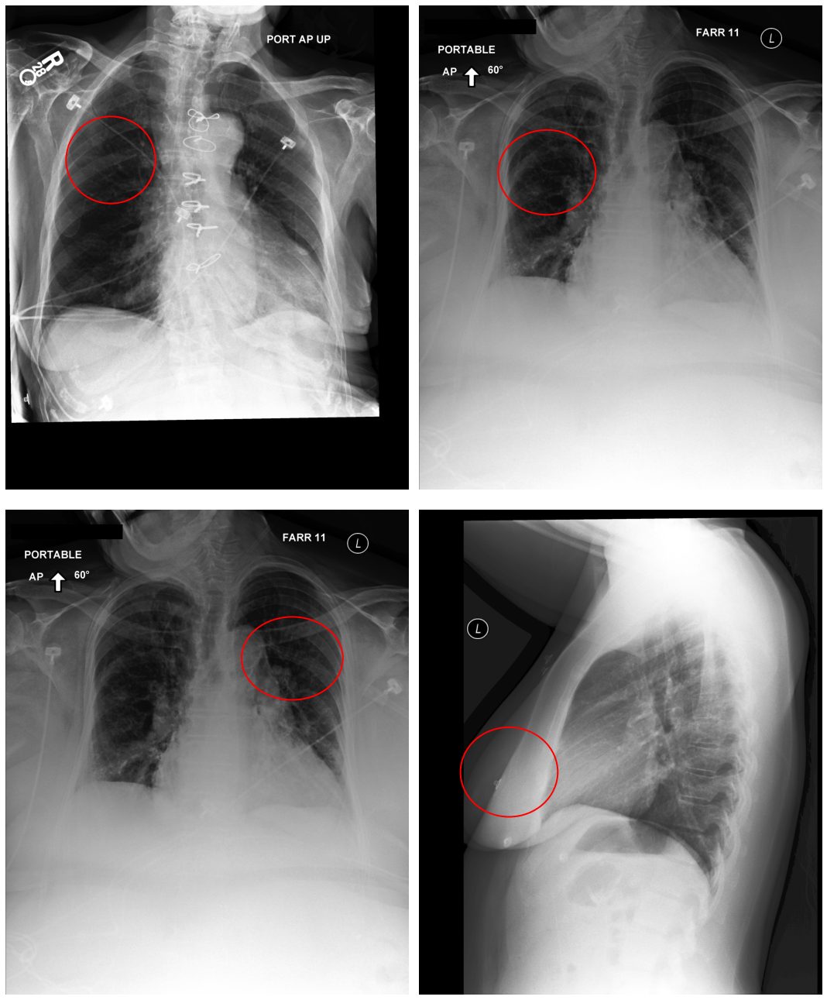

In [ ]:
key_condition = "Airway wall thickening"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[0,4,5] ) 

#### Atelectasis

Total patients with Key Condition Atelectasis = 806


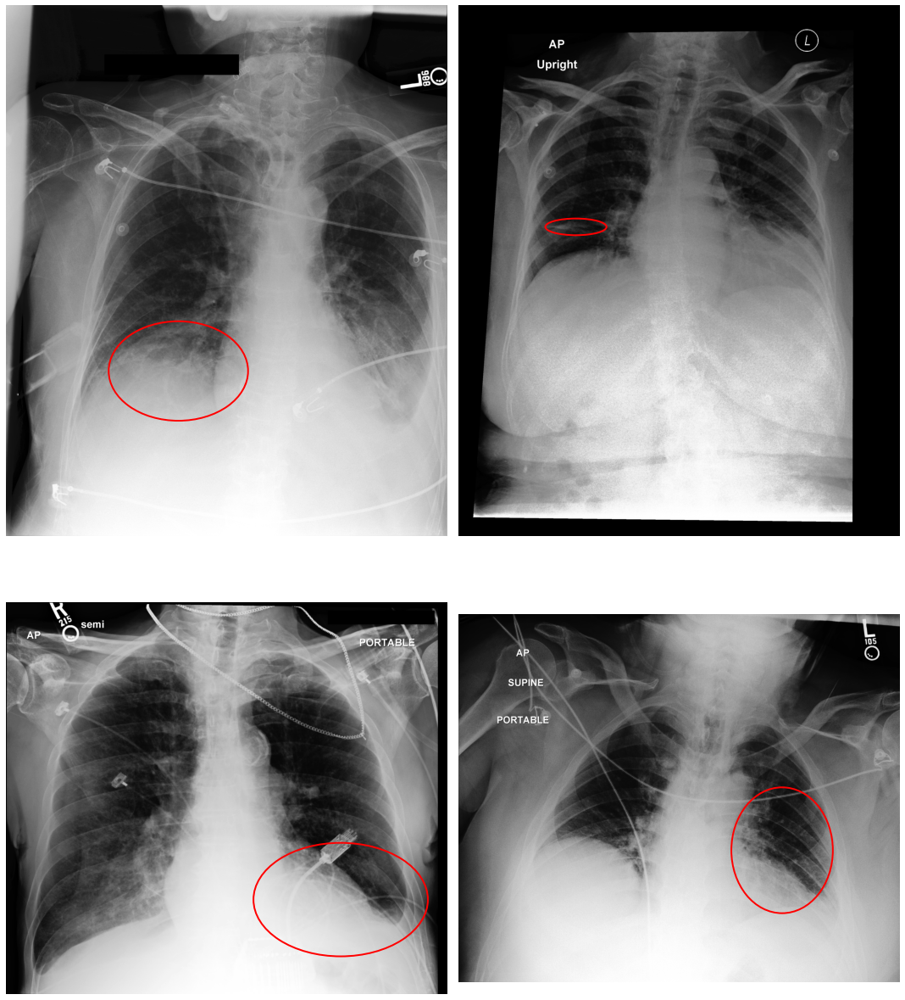

In [ ]:
key_condition = "Atelectasis"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,40] ) 


#### Consolidation

Total patients with Key Condition Consolidation = 787


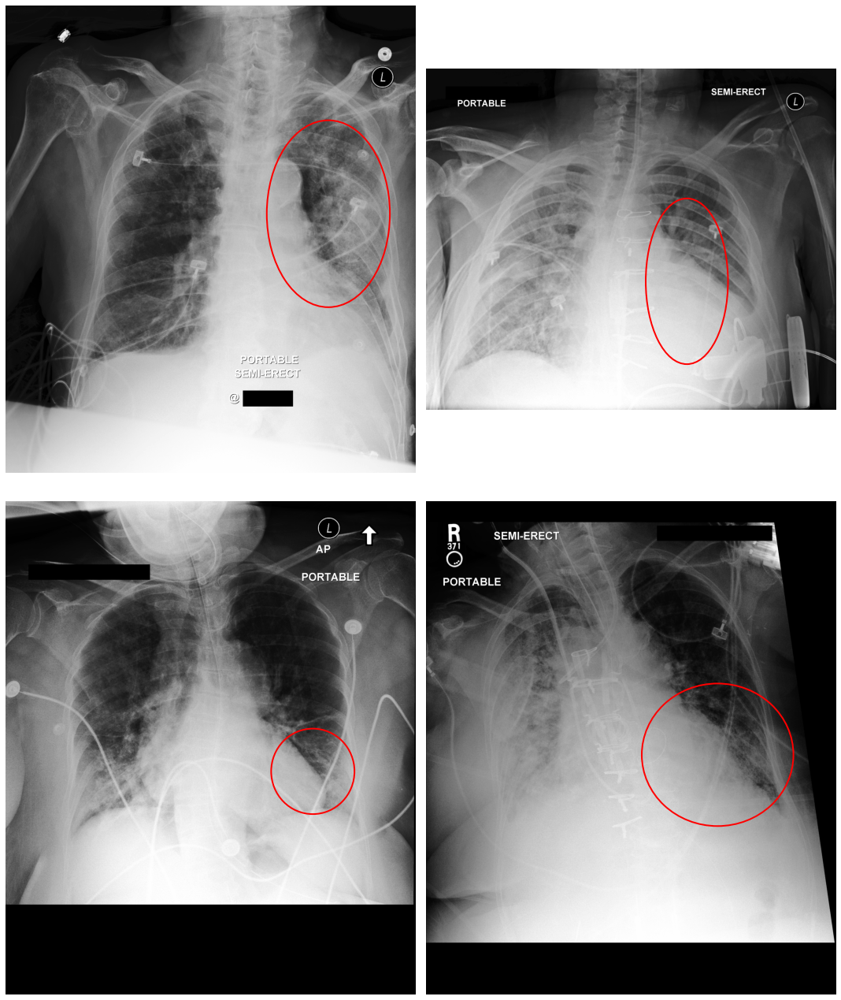

In [ ]:
key_condition = "Consolidation"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,40] ) 


#### Emphysema

Total patients with Key Condition Emphysema = 2


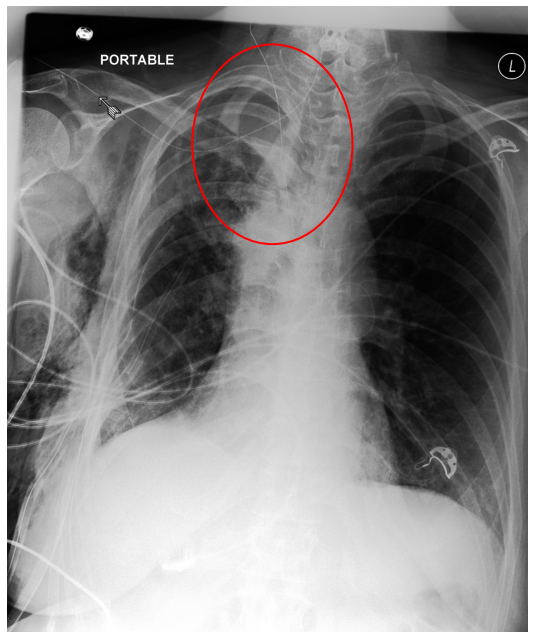

In [ ]:
key_condition = "Emphysema"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[1] ) 


#### Enlarged cardiac silhouette

Total patients with Key Condition Enlarged cardiac silhouette = 455


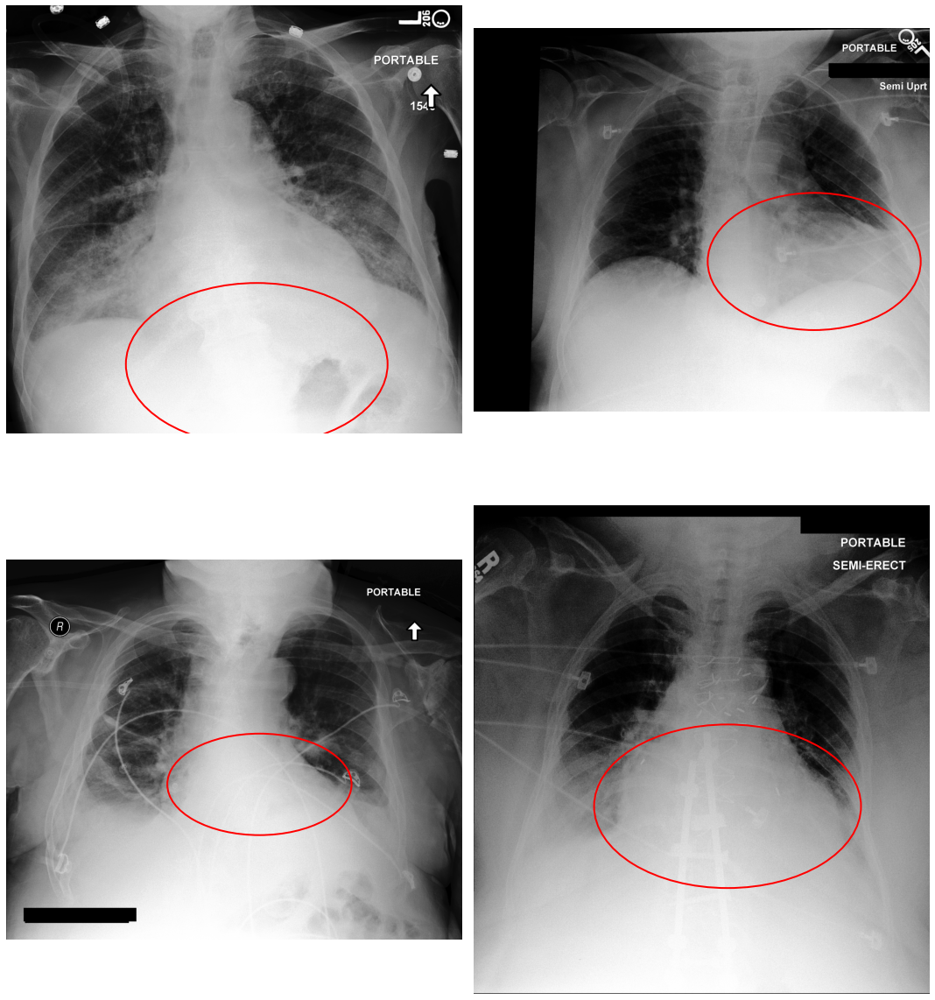

In [ ]:
key_condition = "Enlarged cardiac silhouette"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,35,40] ) 


#### Enlarged hilum

Total patients with Key Condition Enlarged hilum = 41


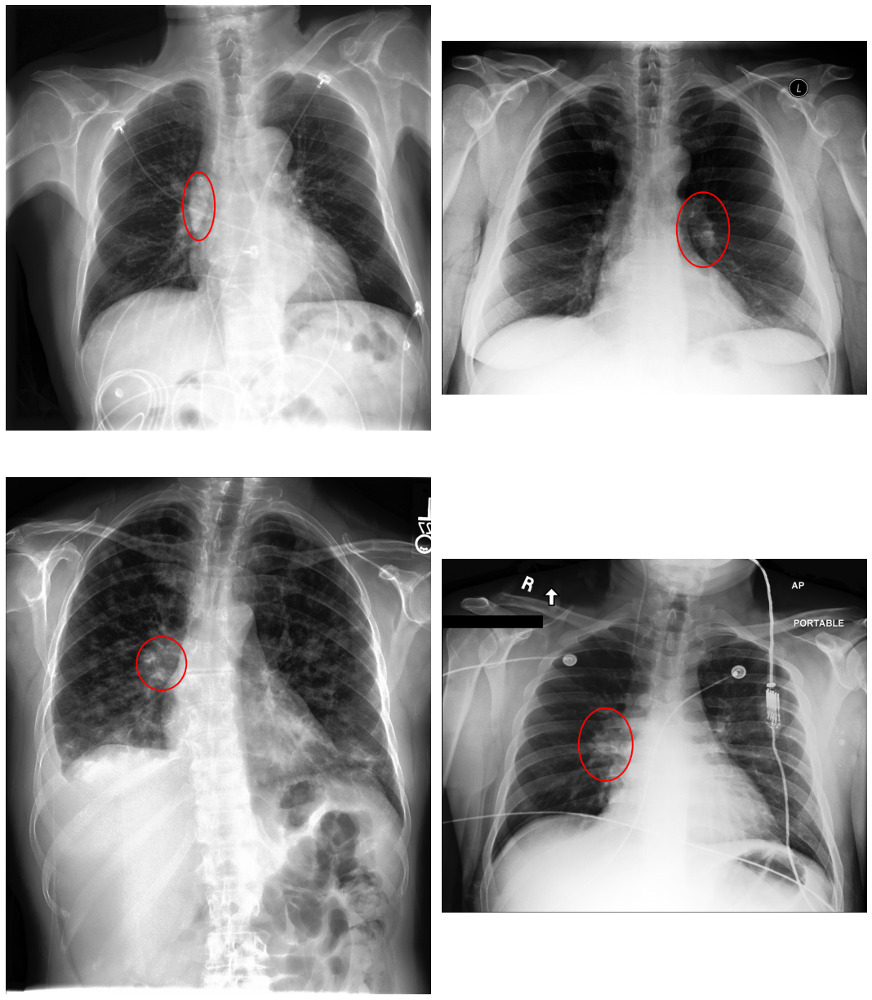

In [ ]:
key_condition = "Enlarged hilum"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[5,20,30,40] ) 


#### Groundglass opacity

Total patients with Key Condition Groundglass opacity = 411


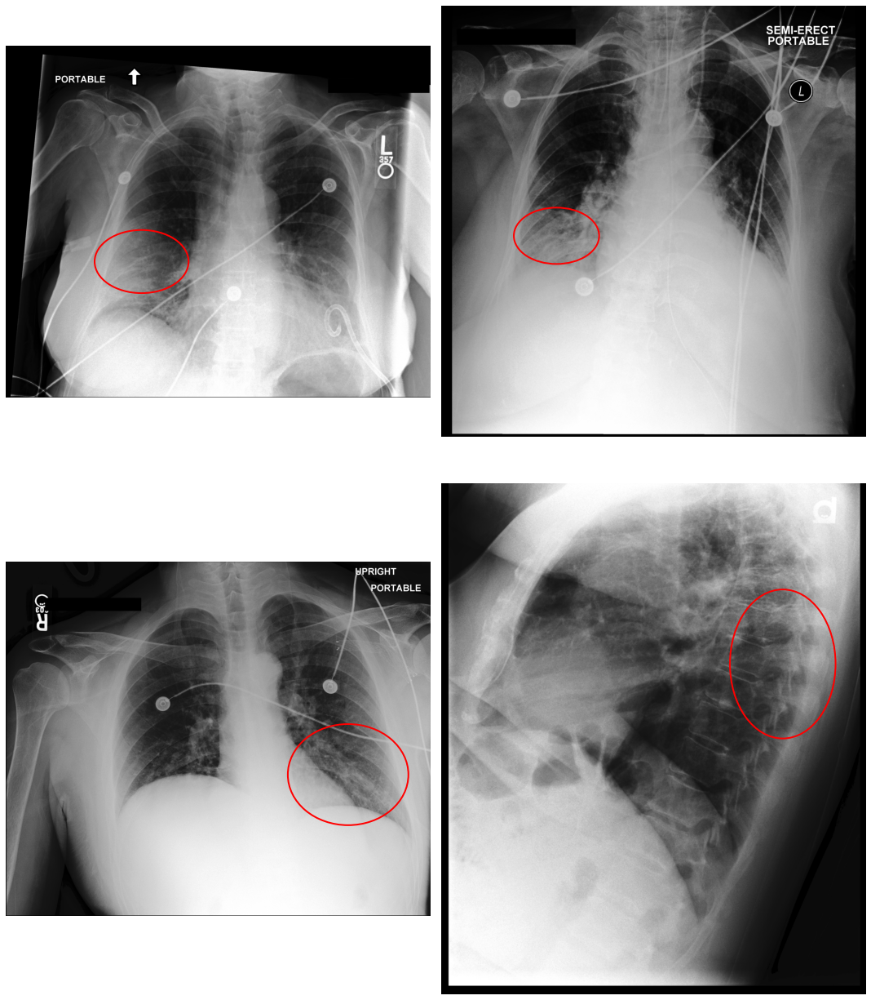

In [ ]:
key_condition = "Groundglass opacity"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,41] ) 


#### Hiatal hernia

Total patients with Key Condition Hiatal hernia = 20


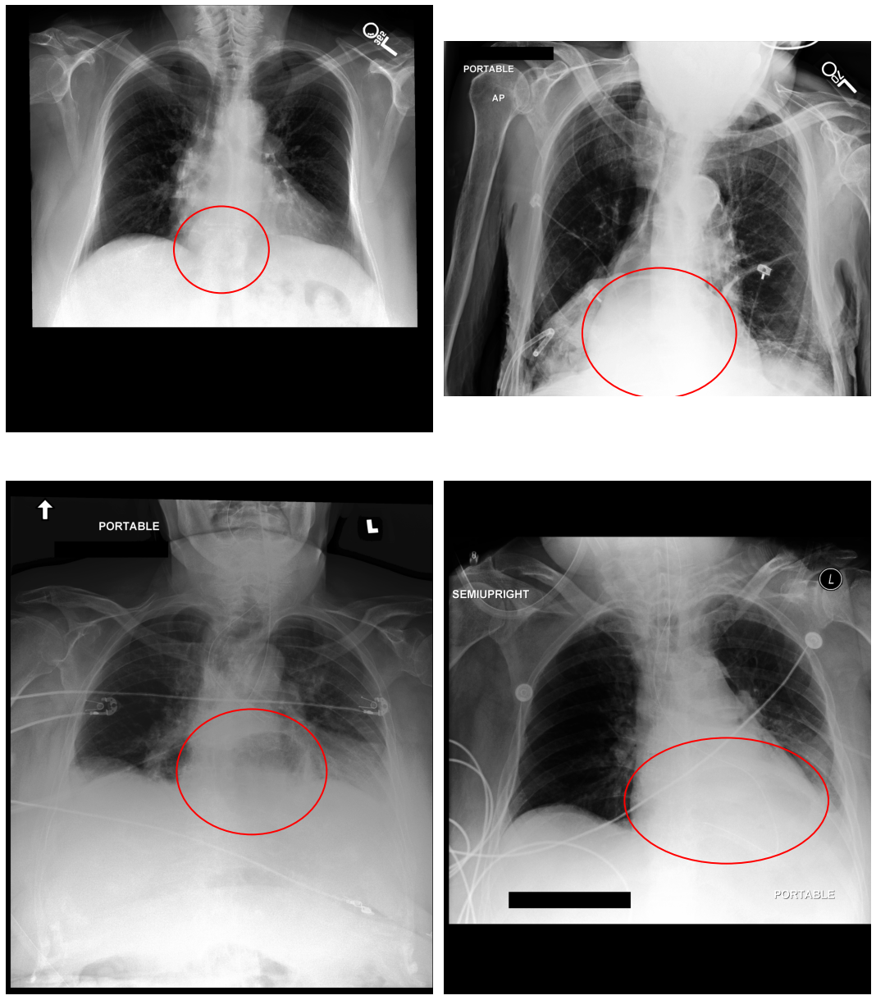

In [ ]:
key_condition = "Hiatal hernia"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[5,11,15,19] ) 


#### High lung volume / emphysema

Total patients with Key Condition High lung volume / emphysema = 90


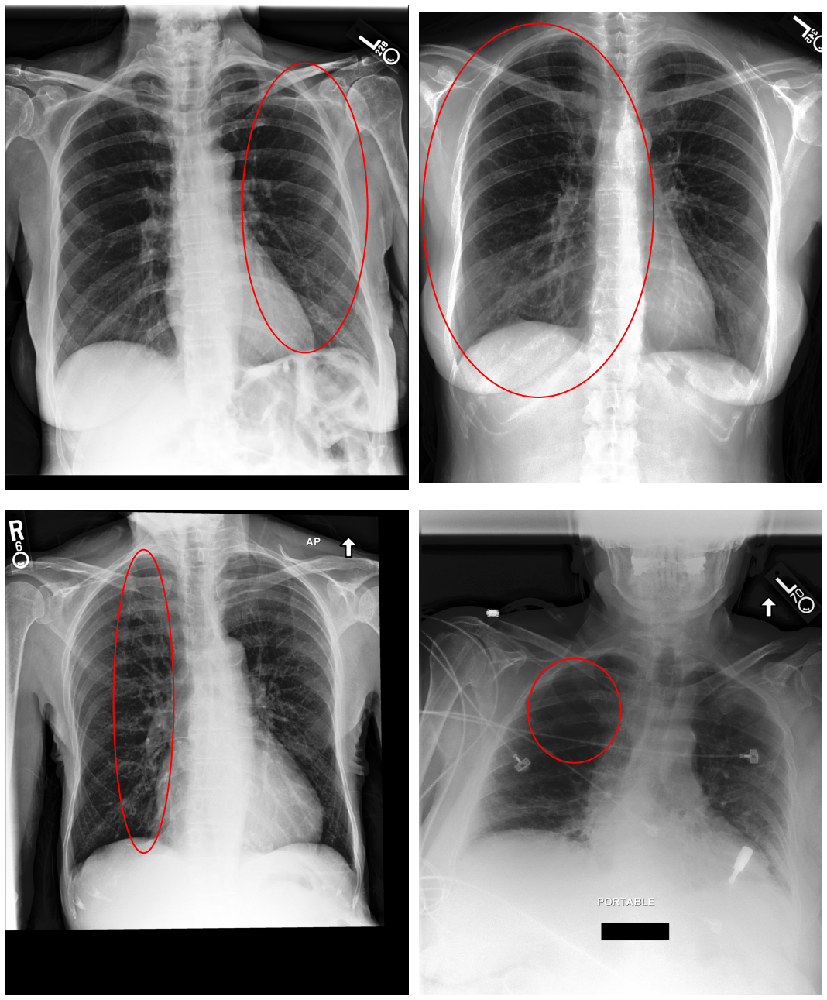

In [ ]:
key_condition = "High lung volume / emphysema"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,35,40] ) 


#### Interstitial lung disease

Total patients with Key Condition Interstitial lung disease = 49


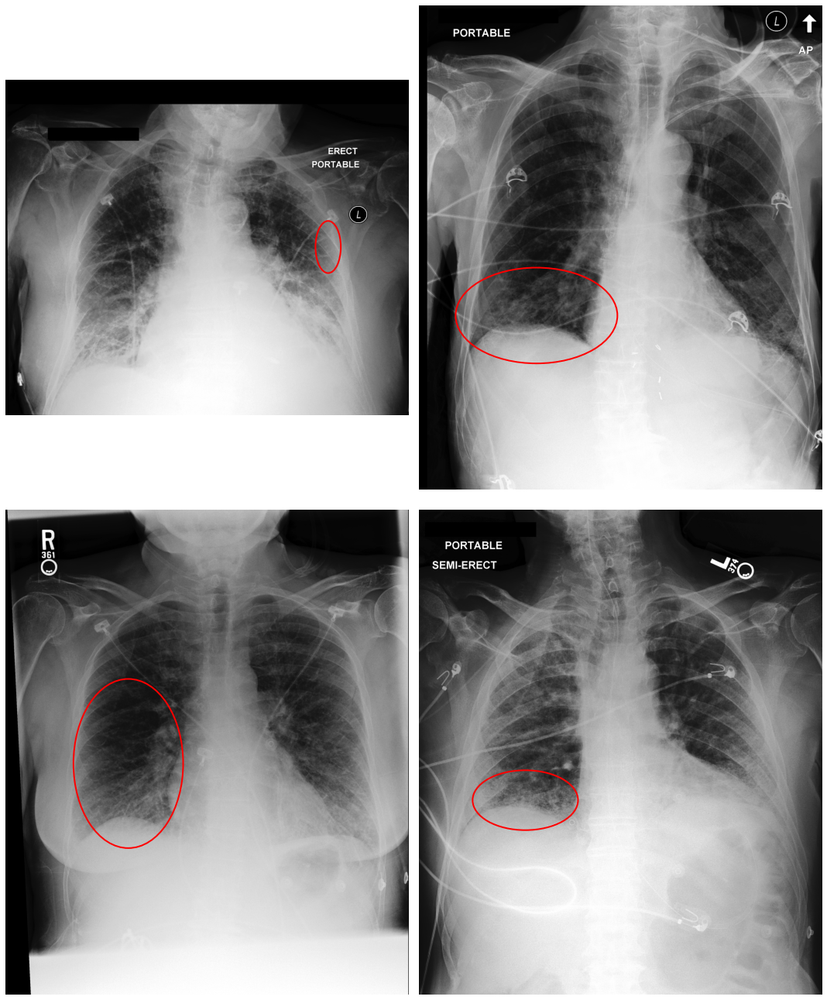

In [ ]:
key_condition = "Interstitial lung disease"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,41] ) 


#### Lung nodule or mass

Total patients with Key Condition Lung nodule or mass = 154


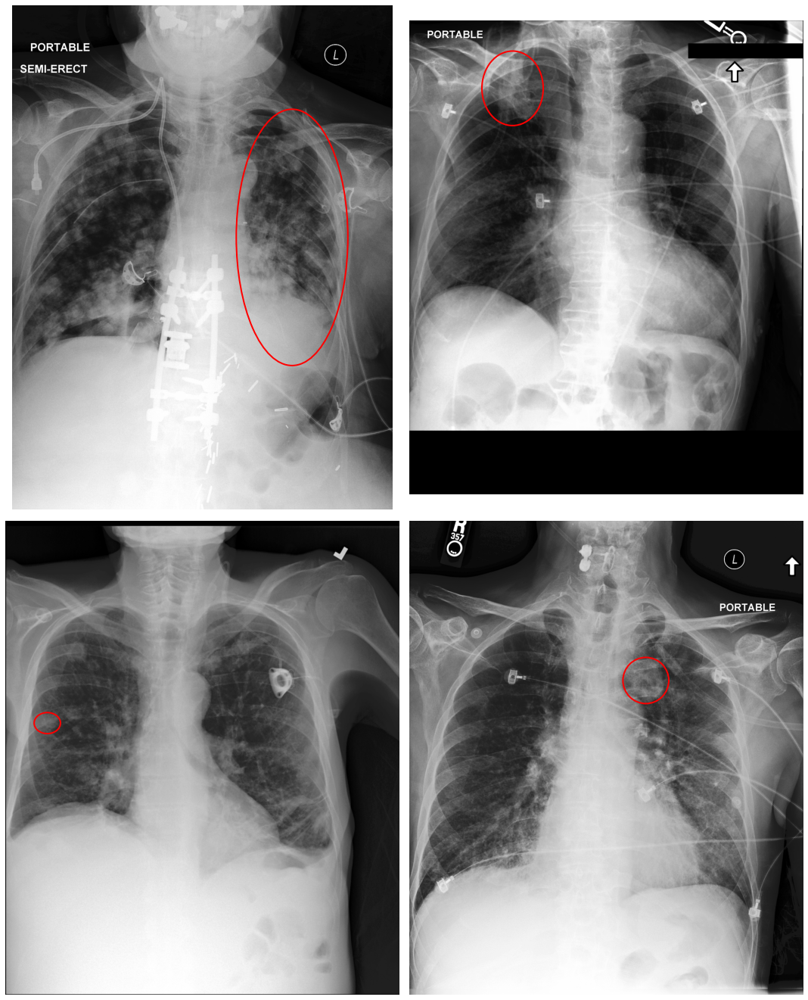

In [ ]:
key_condition = "Lung nodule or mass"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[4,20,35,40] ) 


#### Pleural abnormality

Total patients with Key Condition Pleural abnormality = 831


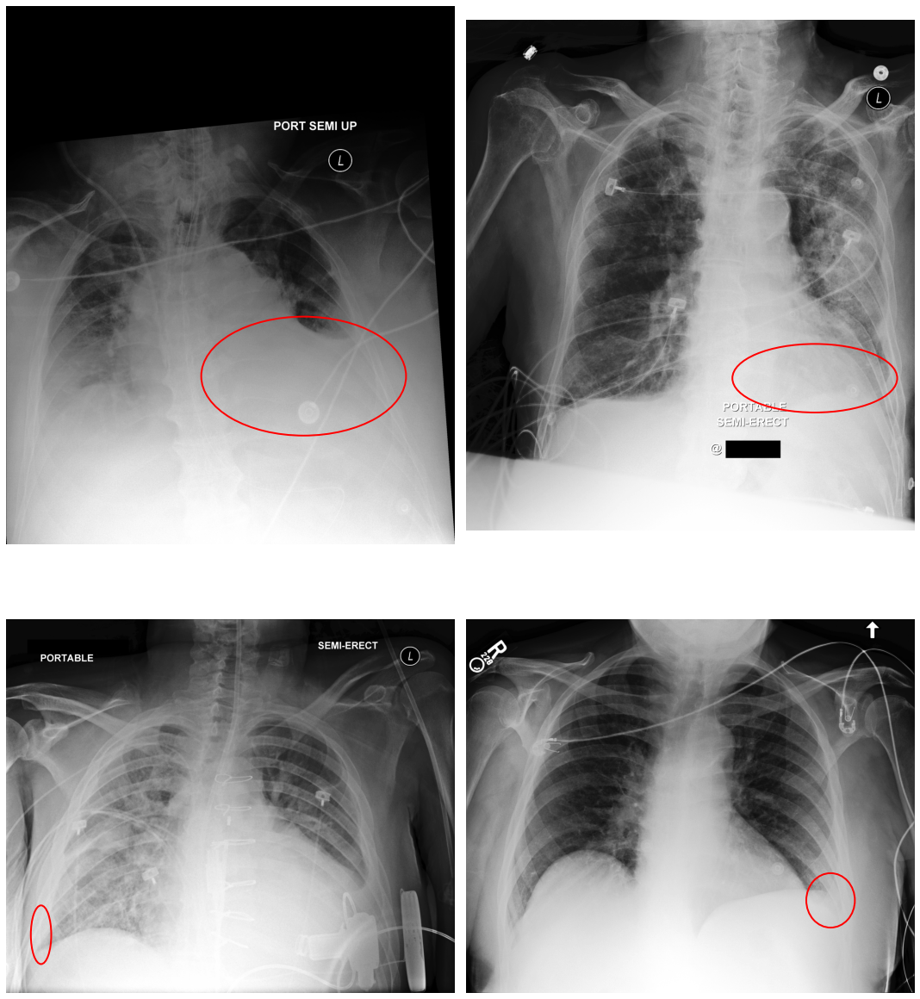

In [ ]:
key_condition = "Pleural abnormality"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,40] ) 


#### Pleural effusion

Total patients with Key Condition Pleural effusion = 24


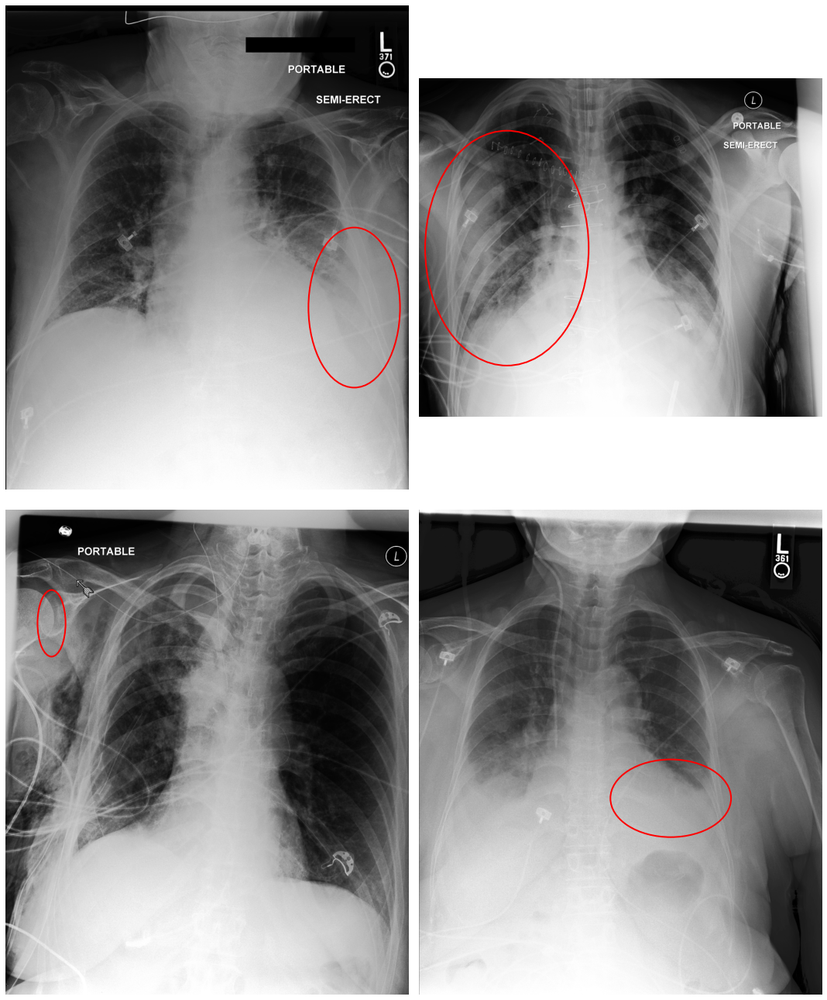

In [ ]:
key_condition = "Pleural effusion"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,5,15] ) 


#### Pneumothorax

Total patients with Key Condition Pneumothorax = 81


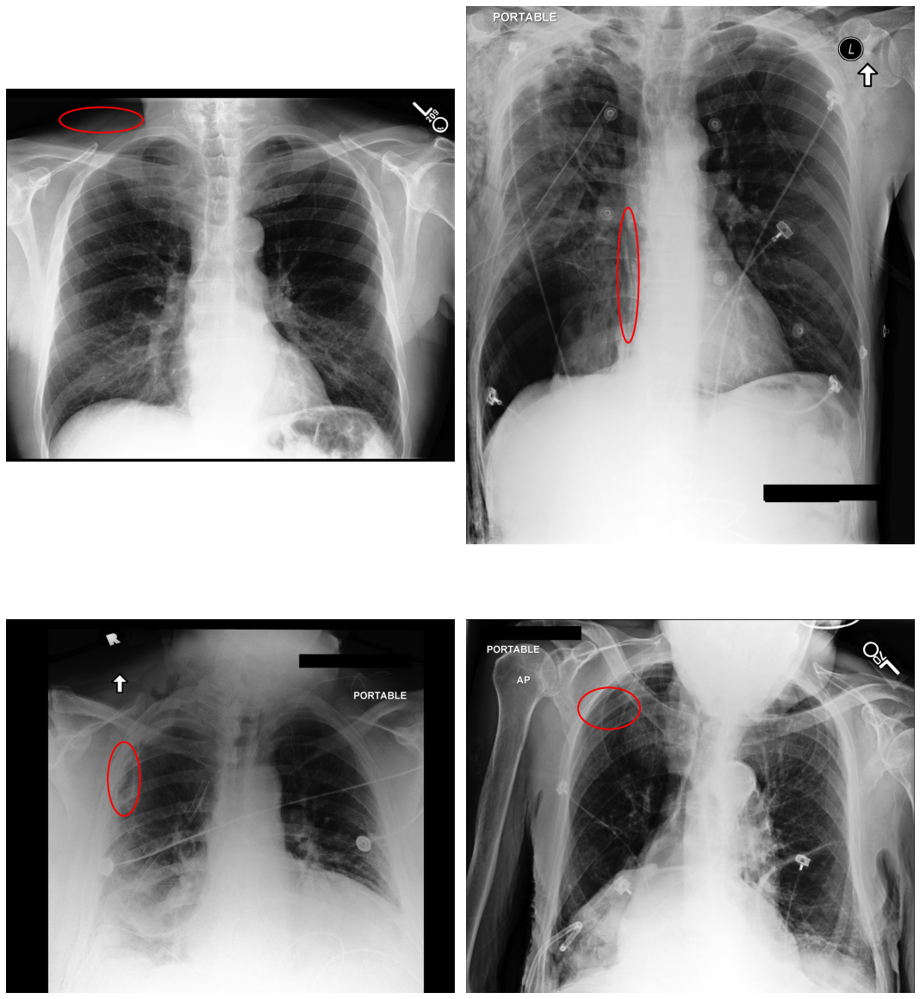

In [ ]:
key_condition = "Pneumothorax"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,45] ) 


#### Pulmonary edema

Total patients with Key Condition Pulmonary edema = 475


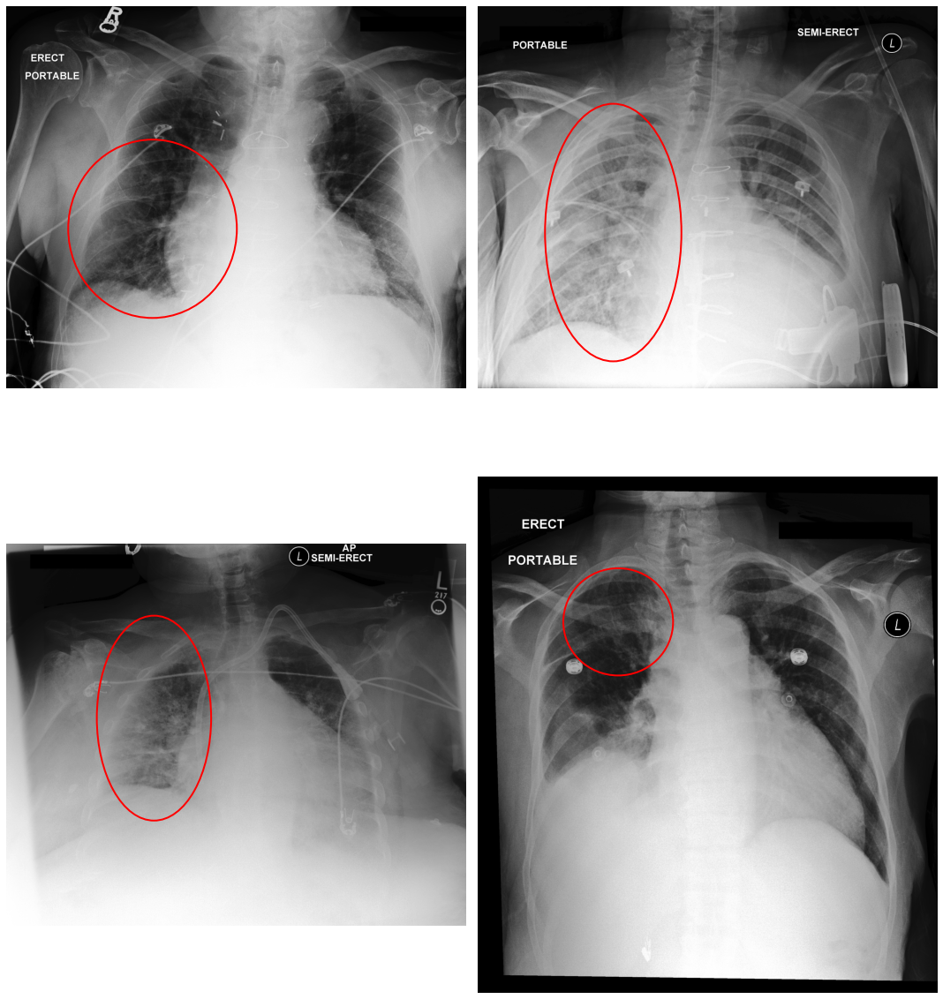

In [ ]:
key_condition = "Pulmonary edema"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[10,20,30,40] ) 


#### Wide mediastinum

Total patients with Key Condition Wide mediastinum = 2


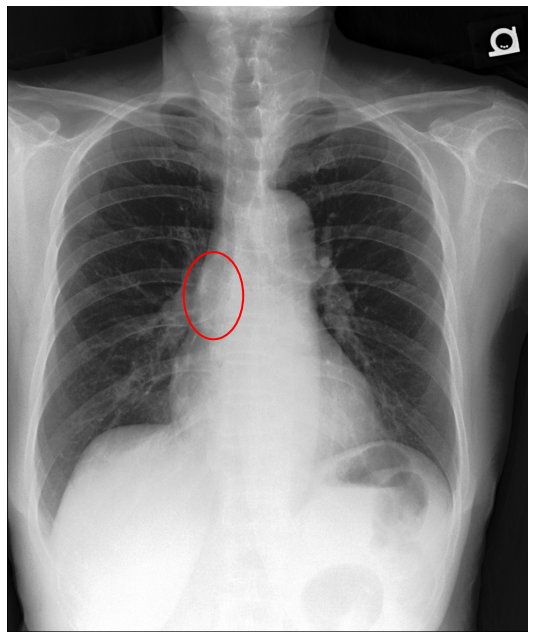

In [ ]:
key_condition = "Wide mediastinum"
plot_key_conditions( key_condition, bbox_df, image_type="jpg", figsize = (15,20), indexes=[1] ) 


### IMAGE_ID COLUMN EXPLORATION

In [ ]:
fig = px.box(bbox_df.sort_values(by="class_label"), x="class_label", y="frac_bbox_area", color="class_label", 
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, notched=True,
             labels={"class_id_as_str":"Class Name", "frac_bbox_area":"BBox Area (%)"},
             title="<b>DISTRIBUTION OF ELLIPSE BBOX AREAS AS % OF SOURCE IMAGE AREA   " \
                   "<i><sub>(Some Upper Outliers Excluded For Better Visualization)</sub></i></b>")

fig.update_layout(showlegend=True,
                  yaxis_range=[-0.025,0.6],
                  xaxis_title="",
                  yaxis_title="<b>Ellipse Bounding Box Area %</b>", font=FIG_FONT,)
fig.layout.height=700
fig.layout.width=1400
fig.show(renderer = "colab")

In [ ]:
fig.write_image("/content/drive/MyDrive/Datasets/REFLACX_Study/distribution_of_ellipse_bbox_areas_v3.png", width=1400, height=700)

#### UNIQUE OBJECT ANNOTATIONS PER IMAGE

In [ ]:
fig = px.histogram(bbox_df.groupby('image_id')["class_label"].unique().apply(lambda x: len(x)), 
             color_discrete_sequence=['skyblue'], opacity=0.7,
             labels={"value":"Number of Unique Abnormalities"},
             title="<b>DISTRIBUTION OF # OF ANNOTATIONS PER PATIENT   " \
                   "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique Abnormalities</b>",
                  yaxis_title="<b>Count of Unique Patients</b>",
                  font=FIG_FONT,)
fig.layout.height=700
fig.layout.width=1400
fig.show(render="colab")

In [ ]:
fig.write_image("/content/drive/MyDrive/Datasets/REFLACX_Study/distribution_of_unique_abnormalities_per_patient.png", width=1400, height=700)

#### ANNOTATIONS PER CLASS

In [ ]:
fig = px.bar(bbox_df.class_label.value_counts().sort_index(), 
             color=bbox_df.class_label.value_counts().sort_index().index, opacity=0.85,
             color_discrete_sequence=LABEL_COLORS, 
             labels={"y":"Annotations Per Class", "x":""},
             title="<b>Annotations Per Class</b>",)
fig.update_layout(legend_title=None,
                  font=FIG_FONT,
                  xaxis_title="",
                  yaxis_title="<b>Annotations Per Class</b>")
fig.layout.height=700
fig.layout.width=1400
fig.show(render="colab")


In [ ]:
fig.write_image("/content/drive/MyDrive/Datasets/REFLACX_Study/annotations_per_class_v2.png", width=1400, height=700)

### EYE TRACKING DATA

### PyGazeAnalyzer

#### Import PyGazeAnalyzer from Github

In [ ]:
# import pygazeanalyzer from GitHub
!git clone https://github.com/esdalmaijer/PyGazeAnalyser.git

%cd /content/PyGazeAnalyser

Cloning into 'PyGazeAnalyser'...
remote: Enumerating objects: 74, done.
remote: Total 74 (delta 0), reused 0 (delta 0), pack-reused 74
Unpacking objects: 100% (74/74), done.
/content/PyGazeAnalyser


In [ ]:
fixations

,timestamp_start_fixation,timestamp_end_fixation,x_position,y_position,pupil_area_normalized,angular_resolution_x_pixels_per_degree,angular_resolution_y_pixels_per_degree,window_width,window_level,xmin_shown_from_image,ymin_shown_from_image,xmax_shown_from_image,ymax_shown_from_image,xmin_in_screen_coordinates,ymin_in_screen_coordinates,xmax_in_screen_coordinates,ymax_in_screen_coordinates
0,0.183,0.760,835,308,0.919,97,98,1.0002,0.50012,0,0,2544,2556,845,0,2995,2160
1,0.810,1.110,1509,480,0.828,96,97,1.0002,0.50012,0,0,2544,2556,845,0,2995,2160
2,1.144,1.197,1898,635,0.657,96,96,1.0002,0.50012,0,0,2544,2556,845,0,2995,2160
3,1.240,1.601,1296,285,0.581,96,98,1.0002,0.50012,0,0,2544,2556,845,0,2995,2160
4,1.649,2.096,967,664,0.601,96,96,1.0002,0.50012,0,0,2544,2556,845,0,2995,2160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,32.893,33.374,609,583,0.635,97,98,1.0173,0.47522,0,0,2544,2556,845,0,2995,2160
88,33.458,34.090,-496,1273,0.686,104,99,1.0173,0.47522,0,0,2544,2556,845,0,2995,2160
89,34.110,34.354,-419,1312,0.711,102,97,1.0173,0.47522,0,0,2544,2556,845,0,2995,2160
90,34.440,34.640,1657,751,0.732,94,95,1.0173,0.47522,0,0,2544,2556,845,0,2995,2160


In [ ]:
# custom
from pygazeanalyser.edfreader import read_edf
from pygazeanalyser.gazeplotter import draw_fixations, draw_heatmap, draw_scanpath, draw_raw

image_path = PATIENTS_DIC['16993562']['CXR_JPG_1']
fixations_path =  PATIENTS_DIC['16993562']['FIXATIONS_1']
fixations = pd.read_csv( fixations_path )
gaze_path = PATIENTS_DIC['16993562']['GAZE']

DISPSIZE = (1024,768) # (px,px)
SCREENSIZE = (39.9,29.9) # (cm,cm)
SCREENDIST = 61.0 # cm
PXPERCM = np.mean([DISPSIZE[0]/SCREENSIZE[0],DISPSIZE[1]/SCREENSIZE[1]]) # px/cm

draw_fixations(fixations, DISPSIZE, imagefile=image_path, durationsize=True, durationcolour=False, alpha=0.5, savefilename="./img.png")
		

KeyError: ignored